# Identifying Entities in Healthcare Data

## Problem Statement
Suppose ‘BeHealthy’ aims to connect the medical communities with millions of patients across the country.

‘BeHealthy’ has a web platform that allows doctors to list their services and manage patient interactions and provides services for patients such as booking interactions with doctors and ordering medicines online. Here, doctors can easily organise appointments, track past medical records and provide e-prescriptions.
So, companies like ‘BeHealthy’ are providing medical services, prescriptions and online consultations and generating huge data day by day.
Let’s take a look at the following snippet of medical data that may be generated when a doctor is writing notes to his/her patient or as a review of a therapy that he or she has done.
“The patient was a 62-year-old man with squamous cell lung cancer, which was first successfully treated by a combination of radiation therapy and chemotherapy.”
As you can see in this text, a person with a non-medical background cannot understand the various medical terms. We have taken a simple sentence from a medical data set to understand the problem and where you can understand the terms ‘cancer’ and ‘chemotherapy’. 
Suppose you have been given such a data set in which a lot of text is written related to the medical domain. As you can see in the dataset, there are a lot of diseases that can be mentioned in the entire dataset and their related treatments are also mentioned implicitly in the text, which you saw in the aforementioned example that the disease mentioned is cancer and its treatment can be identified as chemotherapy using the sentence.
But, note that it is not explicitly mentioned in the dataset about the diseases and their treatment, but somehow, you can build an algorithm to map the diseases and their respective treatment.

There are eight major tasks that we performed to complete the assignment. They are as follows:</br>
1.	Data preprocessing</br>
2.	Concept identification</br>
3.	Defining the features for CRF</br>
4.	Getting the features words and sentences</br>
5.	Defining input and target variables</br>
6.	Building the model</br>
7.	Evaluating the model</br>
8.	Identifying the diseases and predicted treatment using a custom NER</br>


## Workspace set up: Import and Install useful packages.

In [29]:
!pip install pycrf
!pip install sklearn-crfsuite

In [30]:
import pandas as pd
import numpy as np
import spacy
import sklearn_crfsuite
from sklearn_crfsuite import metrics
model = spacy.load("en_core_web_sm")

# TASK 1 -- Data Preprocessing

As we are already aware that the dataset is in the token format instead of sentences, you need to construct the sentences from the words. There are blank lines after the completion of each sentence or a set of labels in label files ('train_label' and 'test_label') and you need to build a logic to arrange them into sentences or a sequence of labels in the case of label files. You can refer to the following two images to understand this better.
 
**We need to pre-process the data to recover the complete sentences and their labels.** 


### Construct the proper sentences from individual words and print the 5 sentences.

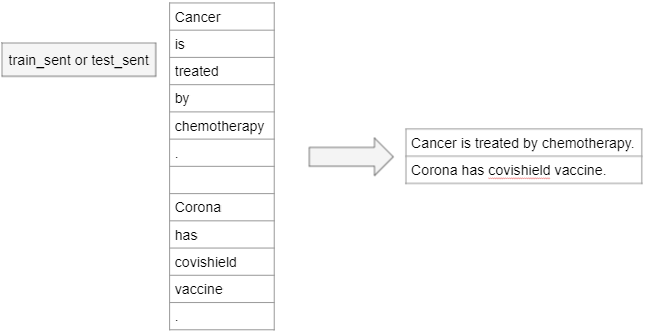

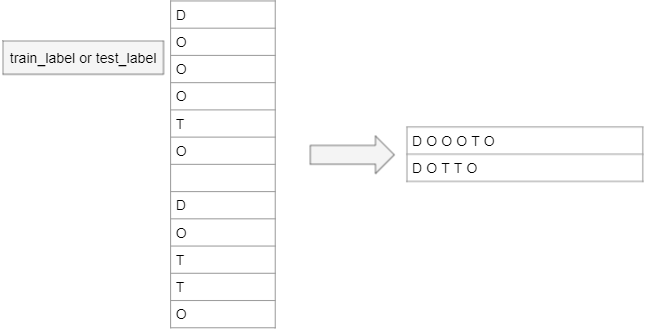

## Our TASK in Data Processing:

We need to do the following three tasks after processing and modifying the datasets:</br>
• 1.1	Construct proper sentences from individual words and print five sentences along with their labels.</br>
• 1.2	Print the correct count of the number of sentences in the processed train and test dataset.</br>
• 1.3	Correctly count the number of lines of labels in the processed train and test dataset.</br>


###  Reading Input File and return a sentence

In [31]:
# Create a function to process the file and return a sentence list
def preprocess_inputfile(input_file):
    i_file = open(input_file, 'r')
    file_name = i_file.readlines()
    i_file.close()

    output_list = []

    full_sentence = ""

    for each_word in file_name:
        each_word = each_word.strip()
        if each_word == "":
            output_list.append(full_sentence) # To append the complete sentence to the output list
            full_sentence = "" # For new sentence start
        else:
            if full_sentence:
                full_sentence += " " + each_word
            else:
                full_sentence = each_word
                
    return output_list

In [32]:
train_sentences = preprocess_inputfile('train_sent')
train_labels = preprocess_inputfile('train_label')
test_sentences = preprocess_inputfile('test_sent')
test_labels = preprocess_inputfile('test_label')

In [33]:
train_sentences

['All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )',
 'The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )',
 'Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )',
 "The `` corrected '' cesarean rate ( maternal-fetal medicine and transported patients excluded ) was 12.4 % ( 273 of 2194 ) , and the `` corrected '' primary rate was 9.6 % ( 190 of 1975 )",
 "Arrest of dilation was the most common indication in both `` corrected '' subgroups ( 23.4 and 24.6 % , respectively )",
 'Cesarean rates at tertiary care hospitals should be compared with rates at community hospitals only after correcting for dissimilar patient groups or gestational age',
 'In the third trimester , the amniotic fluid index ( AFI ) may be affected by maternal fluid 

In [34]:
train_labels

['O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O',
 'O O O O O O O D D O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O T T',
 'O O O O O O O O',
 'O O O O O O O O O O O O O O O O O',
 'O O O O O O O O D D D D D D O T T T O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 '

In [35]:
test_sentences

['Furthermore , when all deliveries were analyzed , regardless of risk status but limited to gestational age > or = 36 weeks , the rates did not change ( 12.6 % , 280 of 2214 ; primary 9.2 % , 183 of 1994 )',
 'As the ambient temperature increases , there is an increase in insensible fluid loss and the potential for dehydration',
 'The daily high temperature ranged from 71 to 104 degrees F and AFI values ranged from 1.7 to 24.7 cm during the study period',
 'There was a significant correlation between the 2- , 3- , and 4-day mean temperature and AFI , with the 4-day mean being the most significant ( r = 0.31 , p & # 60 ; 0.001 )',
 'Fluctuations in ambient temperature are inversely correlated to changes in AFI',
 'This study tested the hypothesis that to reduce the rate of macrosomic infants in gestational diabetes cases , good glycemic control should be initiated before 34 completed gestational weeks',
 "In the `` early '' and `` late '' groups , mean gestational age at the beginning 

In [36]:
test_labels

['O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O D D',
 'O O O O O O O O O O O O O O O O O O O D D O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O O O',
 'D D O O O O O O O O D O D D O O D D D',
 'O O O O O O O O O O O O D O O O O O O O O O',
 'O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O D O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O',
 'O O O O O O O O O O O O O O 

###  1.1 Construct proper sentences from individual words and print five sentences along with their labels.

In [37]:
# Print first five sentences from the processed dataset
for each_item in range(5):
    print(f"Sentence {each_item+1} is: {train_sentences[each_item]}")
    print(f"Label {each_item+1} is: {train_labels[each_item]}")
    print("*"*100)

Sentence 1 is: All live births > or = 23 weeks at the University of Vermont in 1995 ( n = 2395 ) were retrospectively analyzed for delivery route , indication for cesarean , gestational age , parity , and practice group ( to reflect risk status )
Label 1 is: O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O O
****************************************************************************************************
Sentence 2 is: The total cesarean rate was 14.4 % ( 344 of 2395 ) , and the primary rate was 11.4 % ( 244 of 2144 )
Label 2 is: O O O O O O O O O O O O O O O O O O O O O O O O O
****************************************************************************************************
Sentence 3 is: Abnormal presentation was the most common indication ( 25.6 % , 88 of 344 )
Label 3 is: O O O O O O O O O O O O O O O
****************************************************************************************************
Sentence 4 is: The `` corrected '' ce

### 1.2  Count the number of sentences in the processed train and test dataset 

In [38]:
print(f"Number of sentences in processed train dataset is: {len(train_sentences)}")
print(f"Number of sentences in processed test dataset is: {len(test_sentences)}")

Number of sentences in processed train dataset is: 2599
Number of sentences in processed test dataset is: 1056


### 1.3 Count the number of lines of labels in the processed train and test dataset.

In [39]:
print(f"Number of lines of labels in processed train dataset is: {len(train_labels)}")
print(f"Number of lines of labels in processed test dataset is: {len(test_labels)}")

Number of lines of labels in processed train dataset is: 2599
Number of lines of labels in processed test dataset is: 1056


# TASK -2 ---- Concept Identification

After preprocessing, we will first explore what are the various concepts present in the dataset. For this task, we will use PoS tagging. It is good to identify all the words from the corpus that have a tag of NOUN or PROPN (nouns) and prepare a dictionary of their counts. We will then output the top 25 most frequently discussed concepts in the entire corpus.
 
An important point to note here is that we are using both test and train sentences for concept identification. This is an exploratory analysis on the complete data. 

In this step, you need to perform the following two tasks by considering the train and the test dataset as a single unit of data:</br>
• 2.1	Use a toolkit like spaCy to extract those tokens that have NOUN or PROPN as their PoS tag and find their frequency from the entire dataset that comprises both the train and the test datasets.</br>
• 2.2	Print the top 25 most common tokens with NOUN or PROPN PoS tags for the entire dataset that comprises both the train and the test datasets.</br>


In [40]:
# Creating a list to hold all the tokens which are either NOUN or PROPER NOUN
noun_propn_tokens_list = []

### 2.1  Extract those tokens which have NOUN or PROPN as their PoS tag and find their frequency

In [41]:
# Each token which is a NOUN or PROPN will be appended to the list "noun_propn_tokens_list"
for sentences in (train_sentences, test_sentences):
    for sent in sentences:
        processed_sent = model(sent)
        for each_token in processed_sent:
            if each_token.pos_ == "NOUN" or each_token.pos_ == "PROPN":
                noun_propn_tokens_list.append(each_token.text)

In [42]:
noun_propn_tokens_list

['births',
 'weeks',
 'University',
 'Vermont',
 'delivery',
 'route',
 'indication',
 'age',
 'parity',
 'practice',
 'group',
 'risk',
 'status',
 'rate',
 '%',
 'rate',
 '%',
 'presentation',
 'indication',
 '%',
 'rate',
 'medicine',
 'patients',
 '%',
 'rate',
 '%',
 'Arrest',
 'dilation',
 'indication',
 'subgroups',
 '%',
 'rates',
 'care',
 'hospitals',
 'rates',
 'community',
 'hospitals',
 'groups',
 'age',
 'trimester',
 'fluid',
 'index',
 'AFI',
 'fluid',
 'status',
 'temperature',
 'increases',
 'decrease',
 'AFI',
 'June',
 'August',
 'period',
 'heat',
 'women',
 'singleton',
 'pregnancies',
 'weeks',
 'gestation',
 'testing',
 'AFI',
 'determinations',
 'ambient',
 'temperature',
 'area',
 'day',
 'mean',
 'temperature',
 'test',
 'date',
 'AFI',
 'Spearman',
 'rank',
 'Correlation',
 'relationship',
 'account',
 'AFI',
 'measure',
 'well',
 'being',
 'study',
 'population',
 'women',
 'diabetes',
 'screening',
 'women',
 'clinic',
 'Hadassah',
 'Medical',
 'Center',
 

In [43]:
# Creating a Series to hold the tokens which are either NOUN or PROPER NOUN
df_noun_propn = pd.Series(noun_propn_tokens_list)

In [44]:
df_noun_propn

0            births
1             weeks
2        University
3           Vermont
4          delivery
            ...    
24371       support
24372     treatment
24373       myeloma
24374      globulin
24375      abortion
Length: 24376, dtype: object

### 2 .2  Print the top 25 most common tokens with NOUN or PROPN PoS tags

In [45]:
# Getting then count of each token and sorting the data in top 25 most token counts
df_noun_propn.value_counts().sort_values(ascending=False).head(25)

patients        492
treatment       281
%               247
cancer          200
therapy         175
study           154
disease         142
cell            140
lung            116
group            94
chemotherapy     88
gene             87
effects          85
results          79
women            77
use              74
TO_SEE           74
risk             71
cases            71
surgery          71
analysis         70
rate             67
response         66
survival         65
children         64
Name: count, dtype: int64

## TASK -3 --   Defining features for CRF

Here, you need to perform the following three steps:</br>
<b>3.1.</b>	Define the features with the PoS tag as one of the features.</br>
<b>3.2.</b>	While defining the features in which you have used the PoS tags, you also need to consider the preceding word of the current word. The use of the information of the preceding word makes the CRF model more accurate and exhaustive.</br>
<b>3.3.</b>	Mark the beginning and the end words of a sentence correctly in the form of features.</br>

We have defined the following features for CRF model building:

- f1 = input word is in lower case; 
- f2 = last 3 characters of word;
- f3 = last 2 characers of word;
- f4 = 1; if the word is in uppercase, 0 otherwise;
- f5 = 1; if word is a number; otherwise, 0 
- f6= 1; if the word starts with a capital letter; otherwise, 0
- f7= 1; print BEG if it is the first word of the sentence
- f8= 1; print END if it is the last word of the sentence

In [46]:
# Let's define the features to get the feature value for one word.

def getFeaturesForOneWord(sentence, pos, pos_tags):
  word = sentence[pos]

  features = [
    'word.lower=' + word.lower(), # serves as word id
    'word[-3:]=' + word[-3:],     # last three characters
    'word[-2:]=' + word[-2:],     # last two characters
    'word.isupper=%s' % word.isupper(),  # is the word in all uppercase
    'word.isdigit=%s' % word.isdigit(),  # is the word a number
    'word.startsWithCapital=%s' % word[0].isupper(), # is the word starting with a capital letter
    'word.pos=' + pos_tags[pos]
  ]

  #Use the previous word also while defining features
  if(pos > 0):
    prev_word = sentence[pos-1]
    features.extend([
    'prev_word.lower=' + prev_word.lower(), 
    'prev_word.isupper=%s' % prev_word.isupper(),
    'prev_word.isdigit=%s' % prev_word.isdigit(),
    'prev_word.startsWithCapital=%s' % prev_word[0].isupper(),
    'prev_word.pos=' + pos_tags[pos-1]
  ])
  # Mark the begining and the end words of a sentence correctly in the form of features.
  else:
    features.append('BEG') # feature to track begin of sentence 

  if(pos == len(sentence)-1):
    features.append('END') # feature to track end of sentence
  print(features)
  return features

# TASK-4 -- Getting the features

In this step, you need to perform the following two tasks:</br>
<b> 4.1 </b>	Write the code to get the features' value of a sentence after defining the features in the previous step.</br>
<b> 4.2 </b>	Write the code to get a list of labels of a given preprocessed label line that you have created earlier.</br>


### 4.1  Write a code/function to get the features for a sentence

In [47]:
# Write a code to get features for a sentence.

# Function to get features for a sentence.
def getFeaturesForOneSentence(sentence):
    
    # We need to get the pos_tags to be passed to the function
    processed_sent = model(sentence)
    postags = []
    
    for each_token in processed_sent:
        postags.append(each_token.pos_)
    
    sentence_list = sentence.split()
    return [getFeaturesForOneWord(sentence_list, pos, postags) for pos in range(len(sentence_list))]

### 4.2  Write a code/function to get the labels of a sentence

In [48]:
# Write a code to get the labels for a sentence.

# Function to get the labels for a sentence.
def getLabelsInListForOneSentence(labels):
    return labels.split()


# TASK-5 -- Define input and target variables

In this step, you need to perform the following two tasks:</br>
<b> 5.1 </b>	Extract the features' values for each sentence as an input variable for the CRF model in the test and the train dataset.</br>
<b> 5.2 </b>	Extract the labels as the target variable for the test and the train dataset.</br>


Correctly computing X and Y sequence matrices for training and test data.
Check that both sentences and labels are processed

### 5.1  Define the features' values for each sentence as input variable  for CRF model in test and the train dataset 

In [49]:
X_train = [getFeaturesForOneSentence(sentence) for sentence in train_sentences]
X_test = [getFeaturesForOneSentence(sentence) for sentence in test_sentences]

['word.lower=all', 'word[-3:]=All', 'word[-2:]=ll', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=True', 'word.pos=DET', 'BEG']
['word.lower=live', 'word[-3:]=ive', 'word[-2:]=ve', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=ADJ', 'prev_word.lower=all', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=True', 'prev_word.pos=DET']
['word.lower=births', 'word[-3:]=ths', 'word[-2:]=hs', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=NOUN', 'prev_word.lower=live', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=False', 'prev_word.pos=ADJ']
['word.lower=>', 'word[-3:]=>', 'word[-2:]=>', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=X', 'prev_word.lower=births', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=False', 'prev_word.pos=NOUN']
['word.lowe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['word.lower=conclusion', 'word[-3:]=ION', 'word[-2:]=ON', 'word.isupper=True', 'word.isdigit=False', 'word.startsWithCapital=True', 'word.pos=PROPN', 'BEG']
['word.lower=:', 'word[-3:]=:', 'word[-2:]=:', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=PUNCT', 'prev_word.lower=conclusion', 'prev_word.isupper=True', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=True', 'prev_word.pos=PROPN']
['word.lower=the', 'word[-3:]=The', 'word[-2:]=he', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=True', 'word.pos=DET', 'prev_word.lower=:', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=False', 'prev_word.pos=PUNCT']
['word.lower=prevalence', 'word[-3:]=nce', 'word[-2:]=ce', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=NOUN', 'prev_word.lower=the', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=True', 'prev_word.pos=D

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['word.lower=guidelines', 'word[-3:]=nes', 'word[-2:]=es', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=True', 'word.pos=NOUN', 'BEG']
['word.lower=for', 'word[-3:]=for', 'word[-2:]=or', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=ADP', 'prev_word.lower=guidelines', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=True', 'prev_word.pos=NOUN']
['word.lower=the', 'word[-3:]=the', 'word[-2:]=he', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=DET', 'prev_word.lower=for', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=False', 'prev_word.pos=ADP']
['word.lower=use', 'word[-3:]=use', 'word[-2:]=se', 'word.isupper=False', 'word.isdigit=False', 'word.startsWithCapital=False', 'word.pos=NOUN', 'prev_word.lower=the', 'prev_word.isupper=False', 'prev_word.isdigit=False', 'prev_word.startsWithCapital=False', 'prev_word.pos=DET

### 5.2  Define the labels as the target variable for test and the train dataset

In [50]:
Y_train = [getLabelsInListForOneSentence(labels) for labels in train_labels]
Y_test = [getLabelsInListForOneSentence(labels) for labels in test_labels]

# TASK- 6 --  Build the CRF Model

You need to build the CRF model for a custom NER application using the features and the target variables.

In [51]:
# Build the CRF model.
crf = sklearn_crfsuite.CRF(max_iterations=100)
try:
    crf.fit(X_train, Y_train)
except AttributeError :
    pass


# TASK - 7 --  Evaluation

Evaluate the model using the following two steps:</br>
<b> 7.1 </b>	Predict the labels of each of the tokens in each sentence of the test dataset that has been preprocessed earlier.</br>
<b> 7.2 </b>	Calculate the f1 score using the actual and the predicted labels of the test dataset.</br>


### 7.1  Predict the labels of each of the tokens in each sentence of the test dataset that has been pre processed earlier.

In [52]:
prediction = crf.predict(X_test)

### 7.2  Calculate the f1 score using the actual labels and the predicted labels of the test dataset.

In [53]:
f1_score = metrics.flat_f1_score(Y_test, prediction, average='weighted')
print(f"F1 score is: {round(f1_score,4)}")

F1 score is: 0.9053


# TASK -8 --  Identifying Diseases and Treatments using Custom NER

Now we Create the code or logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset. You can refer to the following image to get an idea on how to create a dictionary where diseases are working as keys and treatments are working as values.

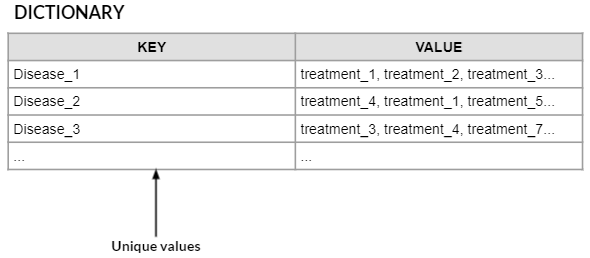

### Create the logic to get all the predicted treatments (T) labels corresponding to each disease (D) label in the test dataset.

In [54]:
# Creating an empty dictionary to hold diseases and their corresponding treatments
D_T_dict = dict()

for i in range(len(prediction)):
    # Get the predicted labels of each test sentence into "val"
    val = prediction[i]
    
    # Empty strings to store the values of Diseases and Treatments
    Diseases = ""
    Treatments = ""
    
    # Each loop will iterate through the individual labels and focus on mapping D and T labels
    # with Diseases and Treatments within each sentence into a concatenated string
    for j in range(len(val)):
        if val[j] == 'D': # If label is D, it indicates a Disease 
            Diseases += test_sentences[i].split()[j] + " "
        elif val[j] == 'T': # If label is T, it indicates a Treatment
            Treatments += test_sentences[i].split()[j] + " "
             
    
    # Removes any extra whitespaces to either end of the string
    Diseases = Diseases.lstrip().rstrip()
    Treatments = Treatments.lstrip().rstrip()

    # If Diseases and Treatments are blank, ignore them
    # If Disease is not present in Dictionary, add it along with the corresponding treatment
    # If Disease is present in the Dictionary, append the treatments for that diseases with existing
    # treatments
    if Diseases != "" and Treatments != "":
        if Diseases in D_T_dict.keys():
            treat_out = list(D_T_dict[Diseases])
            treat_out.append(Treatments)
            D_T_dict[Diseases] = treat_out
        elif Diseases not in D_T_dict.keys():
            D_T_dict[Diseases] = Treatments
 

In [55]:
# At the end add to a run against the test data, create a df from the individual lists
df_disease_treatment = pd.DataFrame({'Disease':D_T_dict.keys(), 'Treatment':D_T_dict.values()})
df_disease_treatment.head(5)

,Disease,Treatment
0,hereditary retinoblastoma,radiotherapy
1,myocardial infarction,"warfarin with 80 mg aspirin , or 1 mg warfarin..."
2,unstable angina,roxithromycin
3,coronary-artery disease,Antichlamydial antibiotics
4,primary pulmonary hypertension ( PPH ),fenfluramines


In [56]:
# shape of new created dataframe
df_disease_treatment.shape

(101, 2)

In [57]:
# 115 rows for Disease and Treatement, let us see how many unique diseases are there in the df column
print(len(df_disease_treatment.Disease.unique()))

101


### Predict the treatment for the disease name: 'hereditary retinoblastoma'

In [58]:
df_disease_treatment[df_disease_treatment.Disease.str.strip() == "hereditary retinoblastoma"] #querying after stripping the leading white space

,Disease,Treatment
0,hereditary retinoblastoma,radiotherapy


## CONCLUSION:

#### The treatment for disease 'hereditary retinoblastoma' is **radiotherapy**